In [2]:
%load_ext jupyter_black
%load_ext autoreload
%autoreload 2

In [3]:
import pandas as pd
import requests
from bs4 import BeautifulSoup
import locale
import pyprind
import os
import matplotlib.pyplot as plt

plt.style.use("ggplot")

locale.setlocale(locale.LC_TIME, "fr_FR")

'fr_FR'

# France info

In [3]:
from functions.media import France_Info

In [4]:
france_info = France_Info()
france_info

In [5]:
france_info.download_all()

0% [##############################] 100% | ETA: 00:00:00
Total time elapsed: 00:00:04


In [6]:
df = france_info.load_data()
df.head()

title  \
2020-02-01 0  La consommation de drogue gagne du terrain en ...   
           1  Coronavirus 2019-nCoV : un journaliste en quar...   
           2  Nouveau monde. Une passion qui peut rapporter ...   
           3  République Démocratique du Congo : un avocat r...   
           4  Fermeture de l'usine Michelin de La Roche-sur-...   

                                                            url  
2020-02-01 0  /monde/afrique/nigeria/la-consommation-de-drog...  
           1  /sante/maladie/coronavirus/coronavirus-un-jour...  
           2  /replay-radio/nouveau-monde/nouveau-monde-une-...  
           3  /monde/afrique/politique-africaine/republique-...  
           4  /economie/emploi/plans-sociaux/fermeture-de-l-...

In [7]:
france_info.is_COVID_related()
france_info.dataframe.head()

title  \
2020-02-01 0  La consommation de drogue gagne du terrain en ...   
           1  Coronavirus 2019-nCoV : un journaliste en quar...   
           2  Nouveau monde. Une passion qui peut rapporter ...   
           3  République Démocratique du Congo : un avocat r...   
           4  Fermeture de l'usine Michelin de La Roche-sur-...   

                                                            url  COVID_related  
2020-02-01 0  /monde/afrique/nigeria/la-consommation-de-drog...          False  
           1  /sante/maladie/coronavirus/coronavirus-un-jour...           True  
           2  /replay-radio/nouveau-monde/nouveau-monde-une-...          False  
           3  /monde/afrique/politique-africaine/republique-...          False  
           4  /economie/emploi/plans-sociaux/fermeture-de-l-...          False

Text(0, 0.5, 'Ratio')

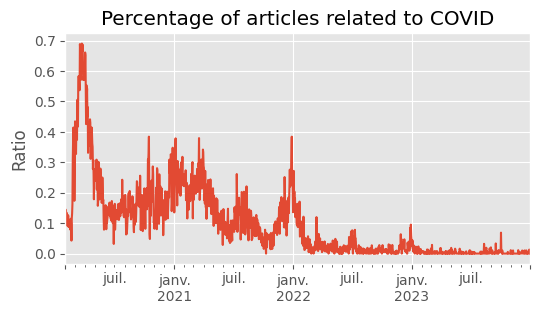

In [8]:
fig, ax = plt.subplots(figsize=(6, 3))
df = france_info.dataframe
df.COVID_related.unstack().mean(axis=1).plot(ax=ax)
ax.set_title("Percentage of articles related to COVID")
ax.set_ylabel("Ratio")

In [9]:
# france_info.load_content_of_COVID_related_papers()

# Le Parisien

In [10]:
from functions.media import Le_Parisien

In [11]:
leparisien = Le_Parisien()

In [12]:
leparisien.download_all()

0% [##############################] 100% | ETA: 00:00:00
Total time elapsed: 00:00:03


In [13]:
leparisien.load_data()

title  \
2020-02-01 0    Haute-Garonne : un homme interpellé pour avoir...   
           1    Chambly : Marvin Martin se reconstruit... en r...   
           2    Vendée : polémique sur des pneus que des salar...   
           3    Feux en Australie : record de chaleur battu à ...   
           4    PSG-Montpellier : Neymar, une soirée en rose e...   
...                                                           ...   
2023-12-31 112  Rungis : grâce à ces experts de la chaîne du f...   
           113  « Il faut éviter de se resservir » : comment l...   
           114  « Peut-être que son meurtrier s’est confié » :...   
           115  Smic, permis à 17 ans, biodéchets, retraites, ...   
           116  La moitié de la planète appelée aux urnes en 2...   

                                                              url  
2020-02-01 0    https://www.leparisien.fr/faits-divers/haute-g...  
           1    https://www.leparisien.fr/sports/oise/chambly-...  
           2    https://www.leparisien.fr/economie/vendee-pole...  
           3    https://www.leparisien.fr/environnement/feux-e...  
           4    https://www.leparisien.fr/sports/football/psg/...  
...                                                           ...  
2023-12-31 112  https://www.leparisien.fr/val-de-marne-94/rung...  
           113  https://www.leparisien.fr/jo-paris-2024/il-fau...  
           114  https://www.leparisien.fr/faits-divers/paris-q...  
           115  https://www.leparisien.fr/economie/consommatio...  
           116  https://www.leparisien.fr/politique/la-moitie-...  

[239909 rows x 2 columns]

In [14]:
leparisien.is_COVID_related()

Text(0, 0.5, 'Ratio')

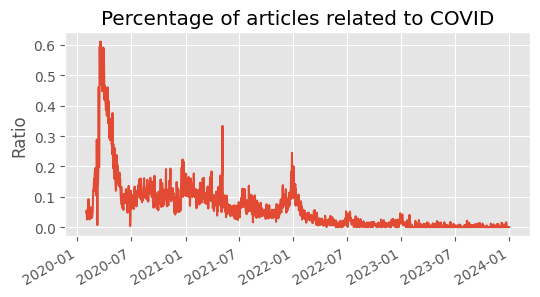

In [15]:
fig, ax = plt.subplots(figsize=(6, 3))
df = leparisien.dataframe
df.COVID_related.unstack().mean(axis=1).plot(ax=ax)
ax.set_title("Percentage of articles related to COVID")
ax.set_ylabel("Ratio")

# Le Monde

In [16]:
from functions.media import Le_Monde

In [17]:
le_monde = Le_Monde()
le_monde

In [18]:
le_monde.download_all()

0% [###                           ] 100% | ETA: 00:00:01

ConnectionError: SOCKSHTTPSConnectionPool(host='www.lemonde.fr', port=443): Max retries exceeded with url: /archives-du-monde/07-07-2020/1/ (Caused by NewConnectionError('<urllib3.contrib.socks.SOCKSHTTPSConnection object at 0x00000264FC34CE50>: Failed to establish a new connection: [WinError 10061] Aucune connexion n’a pu être établie car l’ordinateur cible l’a expressément refusée'))

In [131]:
session = requests.session()
r = session.get("http://httpbin.org/ip")
print(r.text)

{
  "origin": "146.241.170.201"
}



In [135]:
session = requests.session()
session.proxies = {}
session.proxies["http"] = "socks5h://localhost:9050"
session.proxies["https"] = "socks5h://localhost:9050"

In [136]:
r = session.get("http://httpbin.org/ip")
print(r.text)

ConnectionError: SOCKSHTTPConnectionPool(host='httpbin.org', port=80): Max retries exceeded with url: /ip (Caused by NewConnectionError('<urllib3.contrib.socks.SOCKSConnection object at 0x00000229CD97B890>: Failed to establish a new connection: [WinError 10061] Aucune connexion n’a pu être établie car l’ordinateur cible l’a expressément refusée'))

In [56]:
le_monde.load_data()

title  \
2020-02-01 0   Dans le Var, Stanislas Guerini (LRM) veut « to...   
           1   Le Mexique sous le choc après la mort suspecte...   
           2   Bande dessinée : parfum de « Révolution » sur ...   
           3   Candidate à un quatrième mandat, Martine Aubry...   
           4      Ligue 1 : le PSG sans pitié face à Montpellier   
...                                                          ...   
2023-12-31 35  Les messages spirituels cachés derrière « Le S...   
           36  2023 dans le rétro : saurez-vous dater ces gra...   
           37  Quand la sortie du réveillon est gâchée par le...   
           38     2023 : une année de sport résumée en 15 images   
           39  Un pays, des envies, cinq possibilités : la Su...   

                                                             url  \
2020-02-01 0   https://www.lemonde.fr/politique/article/2020/...   
           1   https://www.lemonde.fr/planete/article/2020/02...   
           2   https://www.lemonde.fr/livres/article/2020/02/...   
           3   https://www.lemonde.fr/politique/article/2020/...   
           4   https://www.lemonde.fr/football/article/2020/0...   
...                                                          ...   
2023-12-31 35  https://www.lemonde.fr/le-monde-des-religions/...   
           36  https://www.lemonde.fr/les-decodeurs/article/2...   
           37  https://www.lemonde.fr/argent/article/2023/12/...   
           38  https://www.lemonde.fr/sport/article/2023/12/3...   
           39  https://www.lemonde.fr/m-styles/article/2023/1...   

                                                     description  
2020-02-01 0   A Cuers puis à Saint-Raphaël, le délégué génér...  
           1   Le corps de l’ingénieur agronome, défenseur du...  
           2   Younn Locard et Florent Grouazel remportent le...  
           3   L’ancienne ministre a décidé de se représenter...  
           4   Les Parisiens se sont facilement imposés 5 à 0...  
...                                                          ...  
2023-12-31 35  Le « Seigneur des anneaux » est-il une épopée ...  
           36  Pour vérifier si vous avez bien suivi l’actual...  
           37  L’assureur d’une villa dont la terrasse glissa...  
           38  Du sacre de Novak Djokovic à Roland-Garros aux...  
           39  « La Matinale » vous invite au voyage. Cette s...  

[57128 rows x 3 columns]

In [57]:
le_monde.is_COVID_related()

Text(0, 0.5, 'Ratio')

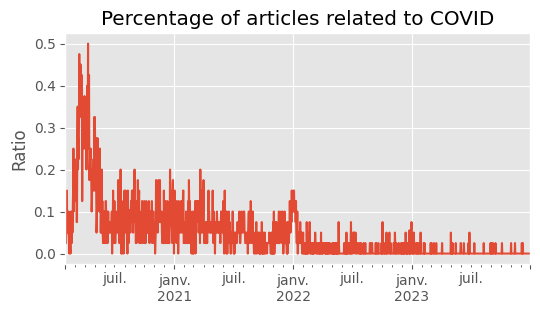

In [58]:
fig, ax = plt.subplots(figsize=(6, 3))
df = le_monde.dataframe
df.COVID_related.unstack().mean(axis=1).plot(ax=ax)
ax.set_title("Percentage of articles related to COVID")
ax.set_ylabel("Ratio")

# L'express

In [19]:
from functions.media import Lexpress

In [20]:
lexpress = Lexpress()
lexpress

In [21]:
lexpress.download_all()

0% [##############################] 100% | ETA: 00:00:00
Total time elapsed: 00:00:04


In [22]:
lexpress.load_data()

title  \
2020-02-01 0   Risque d'avalanches "fort" : la Savoie et la H...   
           1   D'anciens socialistes lancent avec Le Drian un...   
           2   Coronavirus: retour en Allemagne d'une centain...   
           3   Virus chinois : à Hong Kong, le personnel hosp...   
           4   Congé après la perte d'un enfant : Macron inte...   
...                                                          ...   
2023-12-31 12  Espace Schengen : accord pour l’adhésion parti...   
           13  Cadeaux d’occasion : comment les experts en au...   
           14  Macron, Sarkozy et les autres… Les présidents ...   
           15  Démographie : pourquoi la France est de moins ...   
           16  BD, romans, essais... Jérusalem en dix livres ...   

                                                             url  \
2020-02-01 0   https://www.lexpress.fr//environnement/risque-...   
           1   https://www.lexpress.fr//politique/d-anciens-s...   
           2   https://www.lexpress.fr//monde/europe/coronavi...   
           3   https://www.lexpress.fr//monde/asie/virus-chin...   
           4   https://www.lexpress.fr//societe/conge-apres-l...   
...                                                          ...   
2023-12-31 12  https://www.lexpress.fr//monde/europe/espace-s...   
           13  https://www.lexpress.fr//societe/cadeaux-docca...   
           14  https://www.lexpress.fr//politique/macron-sark...   
           15  https://www.lexpress.fr//economie/politique-ec...   
           16  https://www.lexpress.fr//monde/bd-romans-essai...   

                                                     description  
2020-02-01 0   D'après Météo France, certaines avalanches pou...  
           1   Ce mouvement appelé "Territoires de progrès" v...  
           2   Si les passagers ne présentent aucun symptôme ...  
           3   Des membres du personnel d'hôpitaux publics on...  
           4   Cette annonce intervient au lendemain d'un vot...  
...                                                          ...  
2023-12-31 12  Les Vingt-Sept Etats membres se sont mis d’acc...  
           13  Avec l’explosion du marché de la seconde main,...  
           14  Bâtir un récit solide, cohérent, qui irriguera...  
           15  Avec un solde naturel en baisse et un solde mi...  
           16  Notre sélection d’ouvrages, savants ou plus ac...  

[39680 rows x 3 columns]

In [23]:
lexpress.is_COVID_related()

In [24]:
df = lexpress.dataframe.reset_index(level=1)
df.head()

,level_1,title,url,description,COVID_related
2020-02-01,0,"Risque d'avalanches ""fort"" : la Savoie et la H...",https://www.lexpress.fr//environnement/risque-...,"D'après Météo France, certaines avalanches pou...",False
2020-02-01,1,D'anciens socialistes lancent avec Le Drian un...,https://www.lexpress.fr//politique/d-anciens-s...,"Ce mouvement appelé ""Territoires de progrès"" v...",False
2020-02-01,2,Coronavirus: retour en Allemagne d'une centain...,https://www.lexpress.fr//monde/europe/coronavi...,Si les passagers ne présentent aucun symptôme ...,False
2020-02-01,3,"Virus chinois : à Hong Kong, le personnel hosp...",https://www.lexpress.fr//monde/asie/virus-chin...,Des membres du personnel d'hôpitaux publics on...,False
2020-02-01,4,Congé après la perte d'un enfant : Macron inte...,https://www.lexpress.fr//societe/conge-apres-l...,Cette annonce intervient au lendemain d'un vot...,False


In [25]:
df = lexpress.dataframe.reset_index()
df = df.reset_index()
df["level_1"] = df.index
df = df.set_index(["level_0", "level_1"])

Text(0, 0.5, 'Ratio')

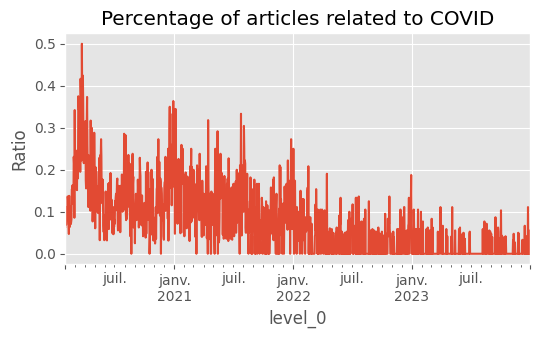

In [26]:
fig, ax = plt.subplots(figsize=(6, 3))
df = lexpress.dataframe.reset_index()
df = df.reset_index()
df["level_1"] = df.index
df = df.set_index(["level_0", "level_1"])
df.COVID_related.unstack().mean(axis=1).plot(ax=ax)
ax.set_title("Percentage of articles related to COVID")
ax.set_ylabel("Ratio")

# Liberation

In [27]:
from functions.media import Liberation

In [28]:
liberation = Liberation()

In [29]:
liberation.download_all()

0% [##############################] 100% | ETA: 00:00:00
Total time elapsed: 00:00:04


In [30]:
liberation.load_data()

title  \
2020-02-01 0                  Le Royaume-Uni se réveille brexité   
           1   Sur Parliament square, les Brexiters célèbrent...   
           2   Brexit en Ecosse : «Une triste fin mais aussi ...   
           3                 Mary Higgins Clark, fin du suspense   
           4   «Le développement du futsal passe par sa profe...   
...                                                          ...   
2023-12-31 32  Hausse du smic, permis de conduire Ã  17Â ans,...   
           33  Guerre Hamas-IsraÃ«lÂ : aucune trÃªve de Nouve...   
           34  RDCÂ : FÃ©lix Tshisekedi, chronique dâ€™une rÃ...   
           35  Au Danemark, la reine Margrethe II abdique et ...   
           36  EnÂ 2024, Emmanuel MacronÂ veut Â«agir, agir e...   

                                                             url  
2020-02-01 0   https://www.liberation.fr//planete/2020/02/01/...  
           1   https://www.liberation.fr//planete/2020/02/01/...  
           2   https://www.liberation.fr//planete/2020/02/01/...  
           3   https://www.liberation.fr//livres/2020/02/01/m...  
           4   https://www.liberation.fr//sports/2020/02/01/l...  
...                                                          ...  
2023-12-31 32  https://www.liberation.fr//economie/hausse-du-...  
           33  https://www.liberation.fr//international/moyen...  
           34  https://www.liberation.fr//international/afriq...  
           35  https://www.liberation.fr//international/europ...  
           36  https://www.liberation.fr//politique/voeux-dem...  

[80703 rows x 2 columns]

In [34]:
liberation.is_COVID_related()

Text(0, 0.5, 'Ratio')

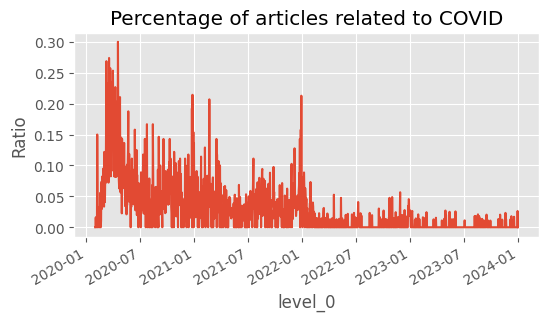

In [35]:
fig, ax = plt.subplots(figsize=(6, 3))
df = liberation.dataframe.reset_index()
df = df.reset_index()
df["level_1"] = df.index
df = df.set_index(["level_0", "level_1"])
df.COVID_related.unstack().mean(axis=1).plot(ax=ax)
ax.set_title("Percentage of articles related to COVID")
ax.set_ylabel("Ratio")

# Media comparison

In [4]:
from functions.media import France_Info
from functions.media import Le_Parisien
from functions.media import Lexpress
from functions.media import Liberation

## Time series

In [7]:
DF = pd.DataFrame()

for Media in [France_Info, Le_Parisien, Lexpress, Liberation]:
    print(Media)
    media = Media()
    media.download_all()
    media.load_data()
    media.is_COVID_related()
    media_name = media.path.split("/")[1]

    if media_name == "lexpress":
        df = media.dataframe.reset_index()
        df = df.reset_index()
        df["level_1"] = df.index
        df = df.set_index(["level_0", "level_1"])
    else:
        df = media.dataframe
    DF[media_name] = df.COVID_related.unstack().mean(axis=1)
DF.head()

<class 'functions.media.France_Info'>


0% [##############################] 100% | ETA: 00:00:00
Total time elapsed: 00:00:07


<class 'functions.media.Le_Parisien'>


0% [##############################] 100% | ETA: 00:00:00
Total time elapsed: 00:00:14


<class 'functions.media.Lexpress'>


0% [##############################] 100% | ETA: 00:00:00
Total time elapsed: 00:00:06


<class 'functions.media.Liberation'>


0% [##############################] 100% | ETA: 00:00:00
Total time elapsed: 00:00:06


,france_info,le_parisien,lexpress,liberation
2020-02-01,0.131944,0.047945,0.063830,0.000000
2020-02-02,0.144737,0.055249,0.105263,0.000000
2020-02-03,0.134409,0.024793,0.069444,0.015873
2020-02-04,0.119048,0.042918,0.069767,0.000000
2020-02-05,0.134328,0.051724,0.110000,0.015873


In [8]:
DF.columns = [col.replace("_", " ").capitalize() for col in DF.columns]
DF.head()

,France info,Le parisien,Lexpress,Liberation
2020-02-01,0.131944,0.047945,0.063830,0.000000
2020-02-02,0.144737,0.055249,0.105263,0.000000
2020-02-03,0.134409,0.024793,0.069444,0.015873
2020-02-04,0.119048,0.042918,0.069767,0.000000
2020-02-05,0.134328,0.051724,0.110000,0.015873


In [11]:
DF.to_csv("data/COVID_in_media.csv")
DF.to_pickle("data/COVID_in_media.pkl")

In [4]:
DF = pd.read_pickle("data/COVID_in_media.pkl")

Text(0, 0.5, 'Percentage (%)')

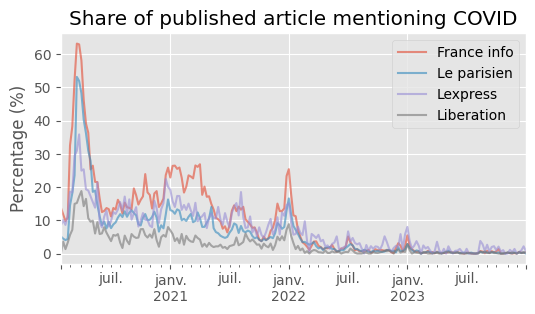

In [5]:
fig, ax = plt.subplots(figsize=(6, 3))
(100 * DF.resample("W").mean()).plot(alpha=0.6, ax=ax)
ax.set_title("Share of published article mentioning COVID")
ax.set_ylabel("Percentage (%)")

## Wordcloud

In [6]:
DF = pd.DataFrame()

list_df = []

for Media in [France_Info, Le_Parisien, Lexpress, Liberation]:
    print(Media)
    media = Media()
    media.download_all()
    media.load_data()
    media.is_COVID_related()
    media_name = media.path.split("/")[1]

    if media_name == "lexpress":
        df = media.dataframe.reset_index()
        df = df.reset_index()
        df["level_1"] = df.index
        df = df.set_index(["level_0", "level_1"])
    else:
        df = media.dataframe

    list_df.append(df)
    # DF[media_name] = df.COVID_related.unstack().mean(axis=1)

<class 'functions.media.France_Info'>


0% [##############################] 100% | ETA: 00:00:00
Total time elapsed: 00:01:56


<class 'functions.media.Le_Parisien'>


0% [##############################] 100% | ETA: 00:00:00
Total time elapsed: 00:02:04


<class 'functions.media.Lexpress'>


0% [##############################] 100% | ETA: 00:00:00
Total time elapsed: 00:02:04


<class 'functions.media.Liberation'>


0% [##############################] 100% | ETA: 00:00:00
Total time elapsed: 00:02:02


In [9]:
DF = pd.concat(list_df, keys=["France_Info", "Le_Parisien", "Lexpress", "Liberation"])
DF.head()

title  \
France_Info 2020-02-01 0  La consommation de drogue gagne du terrain en ...   
                       1  Coronavirus 2019-nCoV : un journaliste en quar...   
                       2  Nouveau monde. Une passion qui peut rapporter ...   
                       3  République Démocratique du Congo : un avocat r...   
                       4  Fermeture de l'usine Michelin de La Roche-sur-...   

                                                                        url  \
France_Info 2020-02-01 0  /monde/afrique/nigeria/la-consommation-de-drog...   
                       1  /sante/maladie/coronavirus/coronavirus-un-jour...   
                       2  /replay-radio/nouveau-monde/nouveau-monde-une-...   
                       3  /monde/afrique/politique-africaine/republique-...   
                       4  /economie/emploi/plans-sociaux/fermeture-de-l-...   

                          COVID_related  index description  
France_Info 2020-02-01 0          False    NaN         NaN  
                       1           True    NaN         NaN  
                       2          False    NaN         NaN  
                       3          False    NaN         NaN  
                       4          False    NaN         NaN

In [31]:
import numpy as np

df_title = DF[DF.COVID_related].title.unstack(level=0)
df_title = df_title.replace(np.nan, "").sum(axis=0, level=0)
df_title.head()

C:\Users\romai\AppData\Local\Temp\ipykernel_15372\2763744796.py:2: FutureWarning: Using the level keyword in DataFrame and Series aggregations is deprecated and will be removed in a future version. Use groupby instead. df.sum(level=1) should use df.groupby(level=1).sum().
  df_title = df_title.replace(np.nan, "").sum(axis=0, level=0)


,France_Info,Le_Parisien,Lexpress,Liberation
2020-02-01,Coronavirus 2019-nCoV : un journaliste en quar...,"Coronavirus : volley, repas et repos... la vie...","Coronavirus : près d'Angers, une usine de masq...",
2020-02-02,"Coronavirus 2019-nCoV : ""J'ai préféré rester à...",Coronavirus : pas de malade parmi les passager...,Coronavirus : les tests réalisés sur une vingt...,
2020-02-03,L'Institut Pasteur appelle aux dons pour finan...,"VIDÉO. Coronavirus : à l’intérieur de Wuhan, ...","Nouveau coronavirus : ""pas d'épidémie en Franc...",Coronavirus : Â«Une stigmatisation sâ€™opÃ¨re ...
2020-02-04,"Coronavirus 2019-nCoV : ""Il existe une fenêtre...",Coronavirus : un équipage d’Air France cloué a...,Coronavirus : les Etats-Unis annoncent un part...,
2020-02-05,Coronavirus 2019-nCoV : réseaux sociaux alarmi...,Coronavirus : la compagnie aérienne Cathay dem...,Coronavirus : l'OMS lance un appel de fonds de...,Y a-t-il déjà des cas de guérisons de personne...


In [32]:
df_title.to_pickle("data/df_title.pkl")

In [5]:
df_title = pd.read_pickle("data/df_title.pkl")

In [6]:
import wordcloud
from stop_words import get_stop_words

In [7]:
stop_words = get_stop_words("fr")
additional_stopwords = []

2020-02-29 00:00:00
2020-03-31 00:00:00
2020-04-30 00:00:00
2020-05-31 00:00:00
2020-06-30 00:00:00
2020-07-31 00:00:00
2020-08-31 00:00:00
2020-09-30 00:00:00
2020-10-31 00:00:00


KeyboardInterrupt: 

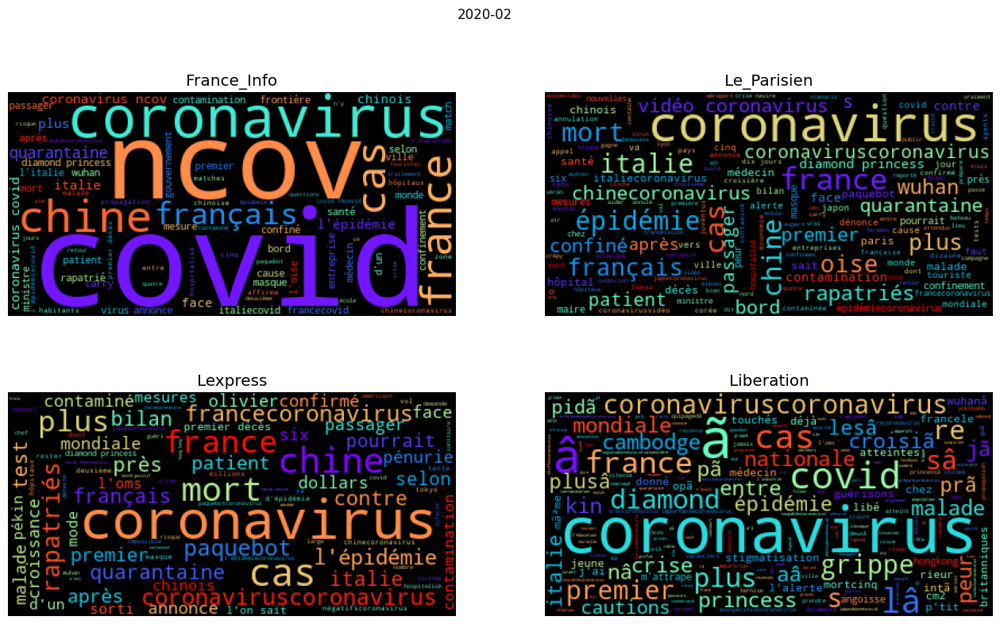

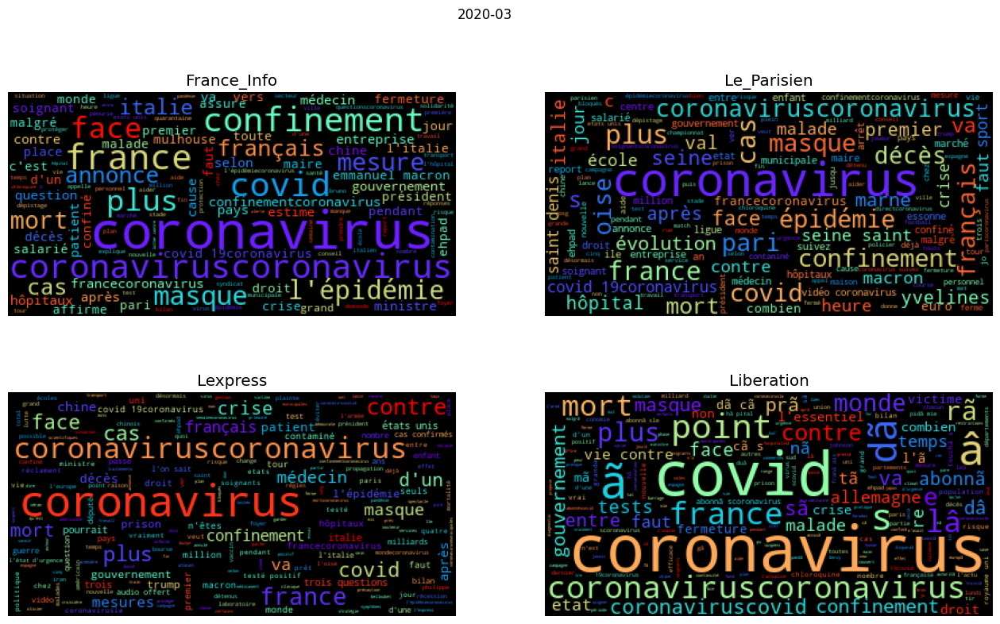

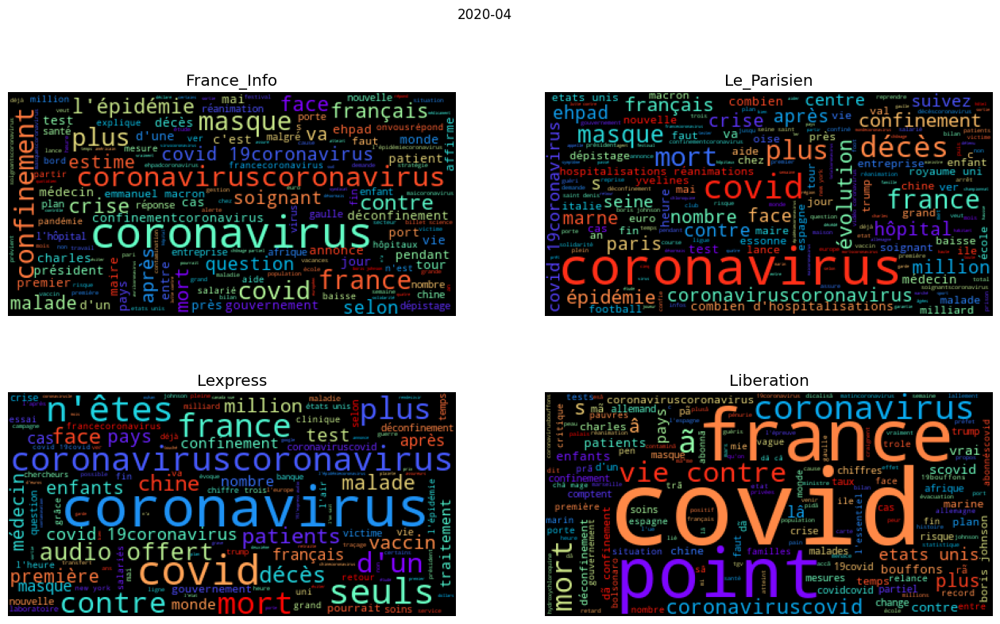

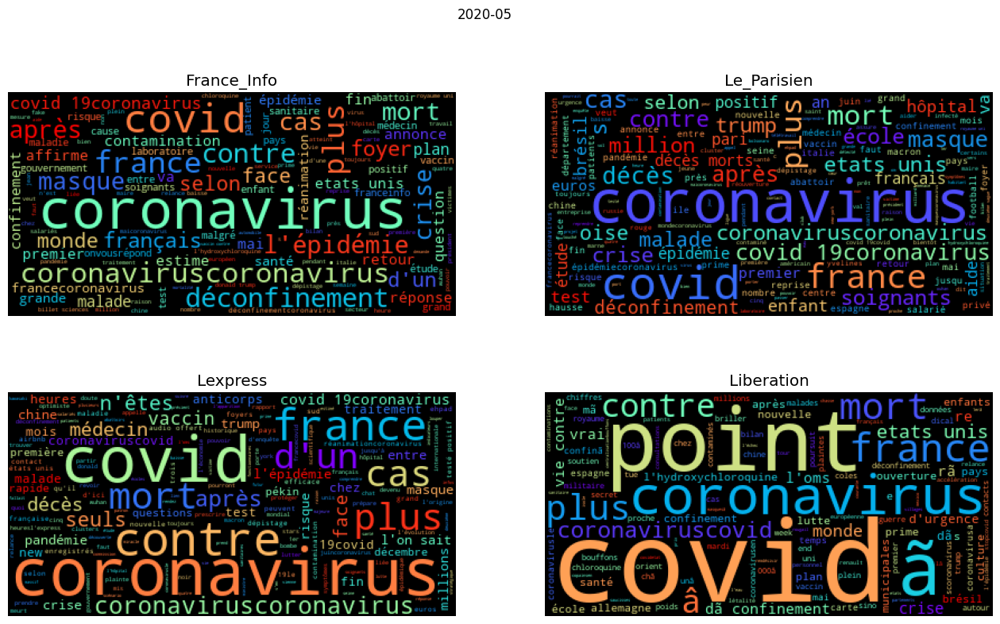

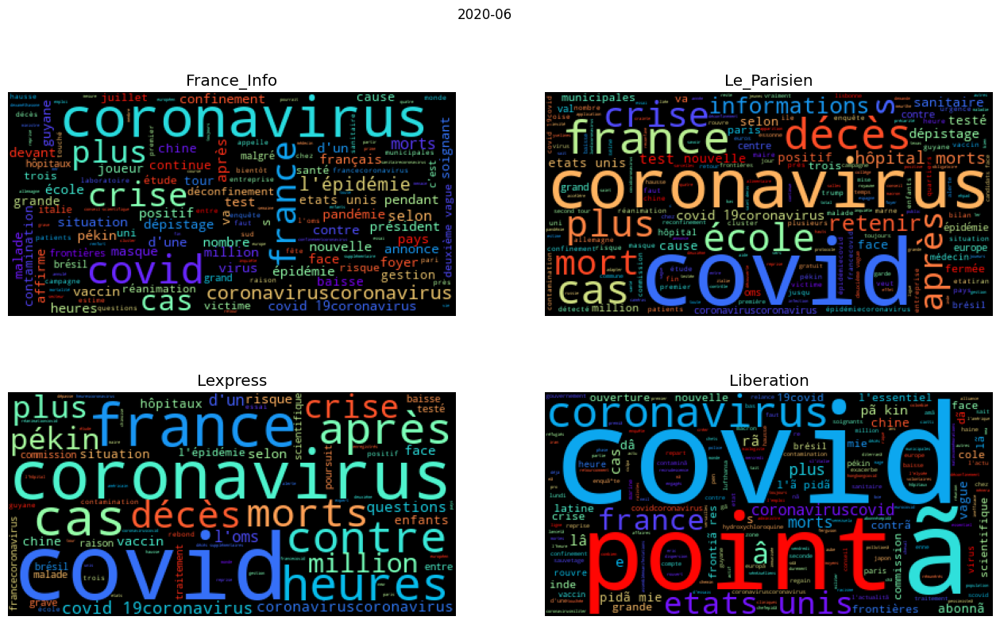

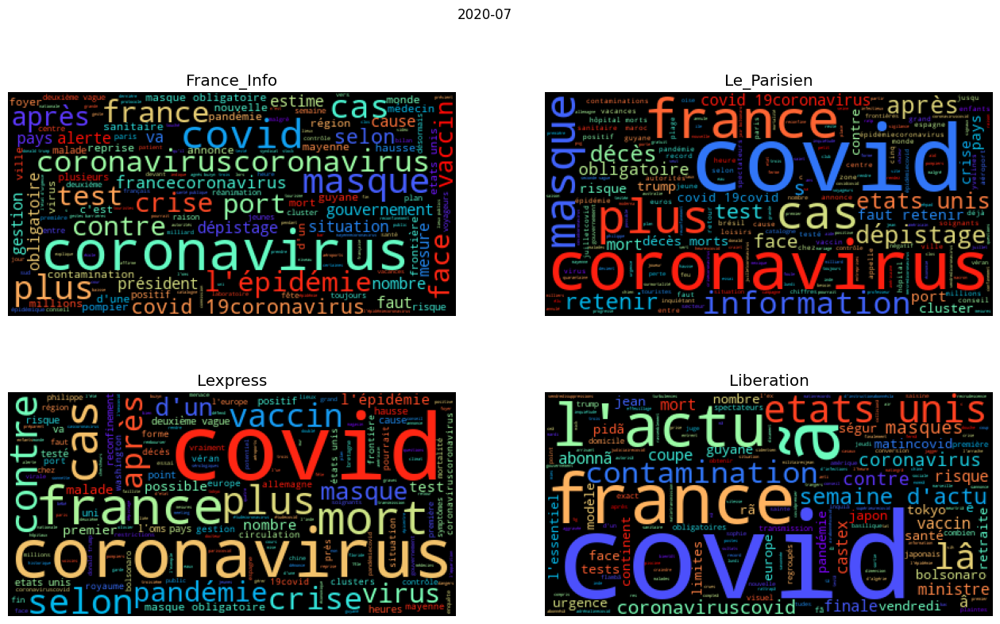

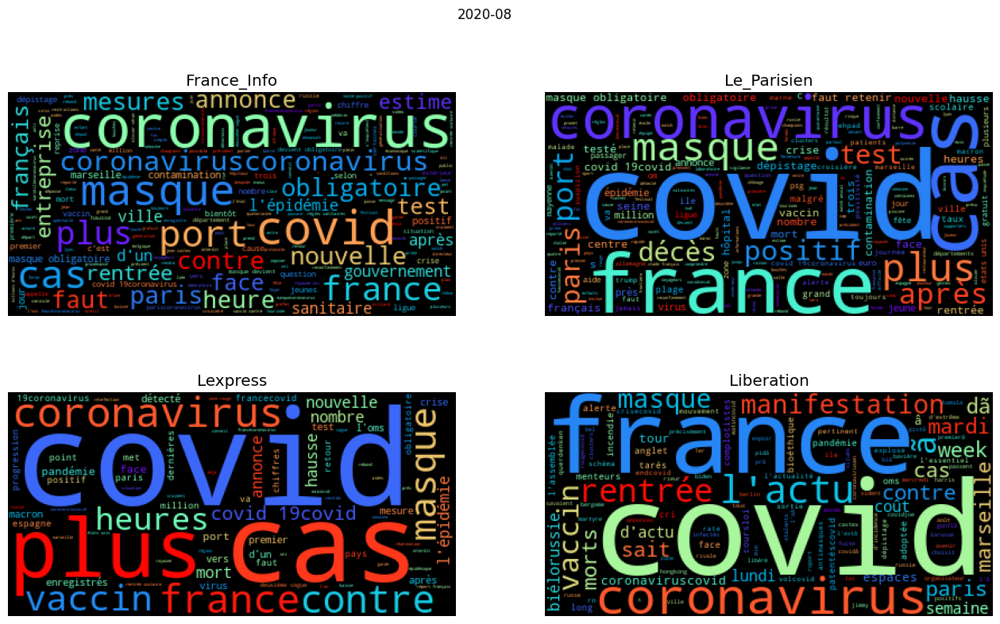

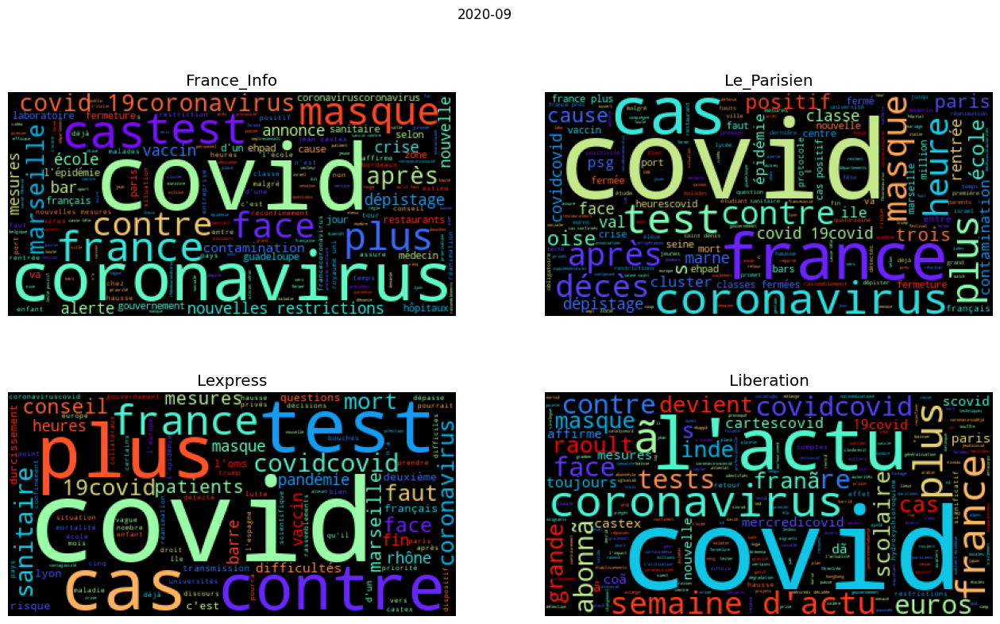

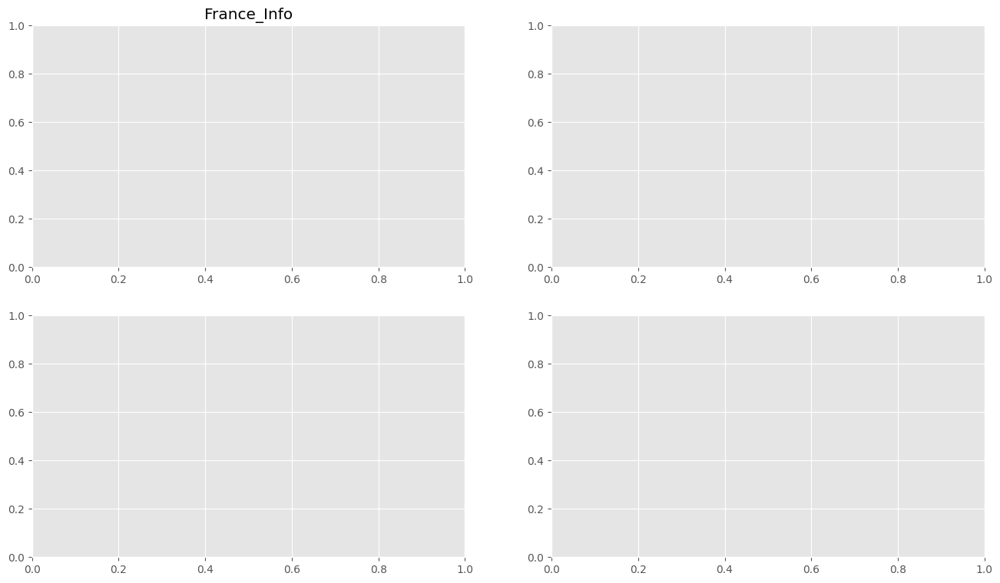

In [12]:
dfp = df_title.resample("M").sum()

for date in dfp.index:
    print(date)

    fig, ax = plt.subplots(2, 2, figsize=(16, 9))
    ax = ax.ravel()
    for i, col in enumerate(df_title.columns):
        ax[i].set_title(col)
        txt = dfp.loc[date][col]
        if len(txt) == 0:
            txt = "Nothing"
        txt = txt.lower()

        WC = wordcloud.WordCloud(
            stopwords=stop_words + additional_stopwords,
            background_color="black",
            colormap="rainbow",
        ).generate(txt)

        im = WC.to_image()

        ax[i].imshow(im)
        ax[i].grid(False)
        ax[i].axis(False)

    date_formated = date.strftime("%Y-%m")
    plt.suptitle(date_formated)
    plt.savefig(f"wordcloud/{date_formated}.png", bbox_inches="tight", pad_inches=0)

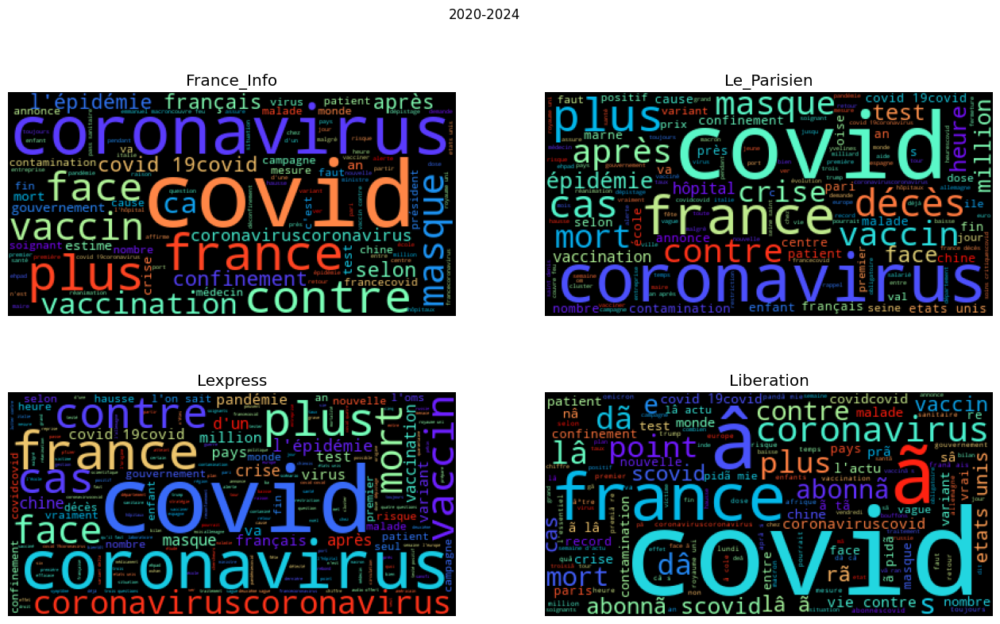

In [13]:
dfp = df_title.sum()

fig, ax = plt.subplots(2, 2, figsize=(16, 9))
ax = ax.ravel()
for i, col in enumerate(df_title.columns):
    ax[i].set_title(col)
    txt = dfp[col]
    if len(txt) == 0:
        txt = "Nothing"
    txt = txt.lower()

    WC = wordcloud.WordCloud(
        stopwords=stop_words + additional_stopwords,
        background_color="black",
        colormap="rainbow",
    ).generate(txt)

    im = WC.to_image()

    ax[i].imshow(im)
    ax[i].grid(False)
    ax[i].axis(False)

    date_formated = date.strftime("%Y-%m")
    plt.suptitle("2020-2024")
    plt.savefig(f"wordcloud/2020-2024.png", bbox_inches="tight", pad_inches=0)

In [14]:
from functions.word_trends import *

In [15]:
list_keywords = [
    ["cas", "malade"],
    ["vaccin", "immunité", "immunité naturelle"],
    ["vaccin", "traitement"],
    ["vaccination", "prévention"],
    [
        "hydroxychloroquine",
        "ivermectine",
        "vitamine",
        "remdesivir",
        "pfizer",
        "moderna",
        # "jonhson",
        "janssen",
    ],
    ["effets indésirables", "effets secondaires", "efficacité vaccinale"],
    ["modélisation", "projection", "observation"],
    [
        "contre productif",
        "contre-productif",
        "contre productive",
        "contreproductive",
    ],
    [
        "efficac",
        "ineffica",
    ],
    [
        "test",
        "masque",
        "dépistage",
    ],
    ["comorbidités", "age", "surpoids"],
    ["peur", "rassur"],
    ["réanimation", "saturation"],
    ["augmentation", "hausse", "diminution", "baisse"],
    ["surveillance", "contrôle", "responsab"],
]

In [ ]:
df_title.sum(axis = 1)

In [19]:
df_title.sum(axis=1)

2020-02-01    Coronavirus 2019-nCoV : un journaliste en quar...
2020-02-02    Coronavirus 2019-nCoV : "J'ai préféré rester à...
2020-02-03    L'Institut Pasteur appelle aux dons pour finan...
2020-02-04    Coronavirus 2019-nCoV : "Il existe une fenêtre...
2020-02-05    Coronavirus 2019-nCoV : réseaux sociaux alarmi...
                                    ...                        
2023-07-04            Â«ClÃ©o, MelvilÂ etÂ moiÂ», candide Covid
2023-08-22    RÃ©surgence du Covid-19 : Â«La prioritÃ© est d...
2023-10-26    Covid : quand un labo occupe la chaise laissÃ©...
2023-11-19    La reconnaissance du Covid long par le Covars,...
2023-12-30    Covid long : Â«Nous crÃ©ons les conditions pot...
Length: 1274, dtype: object

['cas', 'malade']
['vaccin', 'immunité', 'immunité naturelle']
['vaccin', 'traitement']
['vaccination', 'prévention']
['hydroxychloroquine', 'ivermectine', 'vitamine', 'remdesivir', 'pfizer', 'moderna', 'janssen']
['effets indésirables', 'effets secondaires', 'efficacité vaccinale']
['modélisation', 'projection', 'observation']
['contre productif', 'contre-productif', 'contre productive', 'contreproductive']
['efficac', 'ineffica']
['test', 'masque', 'dépistage']
['comorbidités', 'age', 'surpoids']
['peur', 'rassur']
['réanimation', 'saturation']
['augmentation', 'hausse', 'diminution', 'baisse']
['surveillance', 'contrôle', 'responsab']


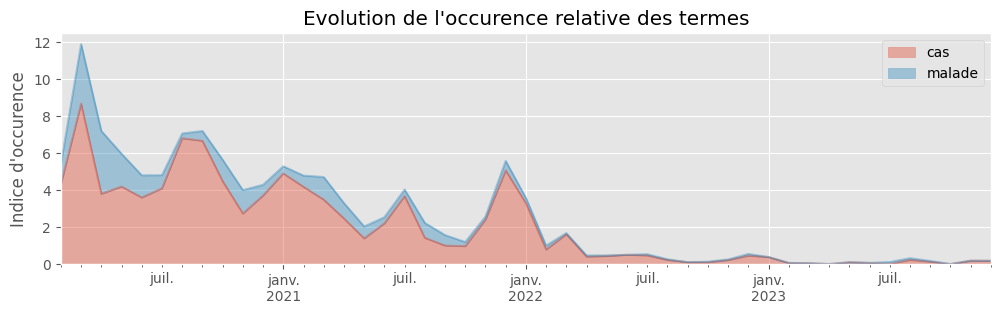

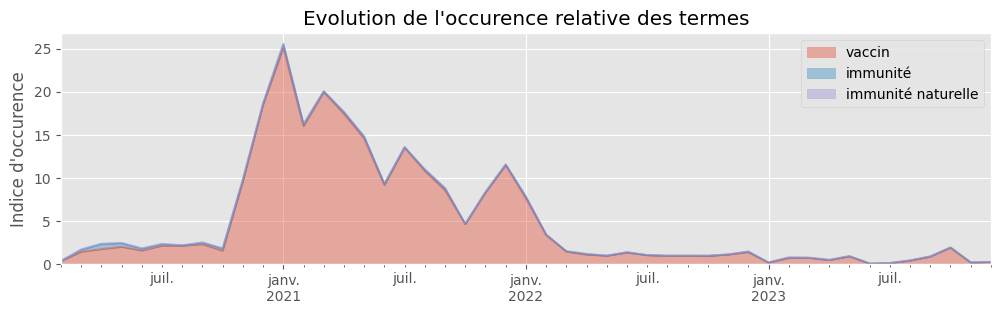

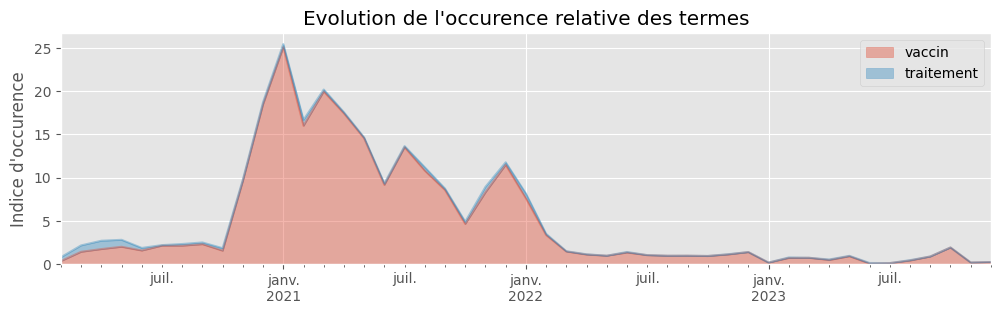

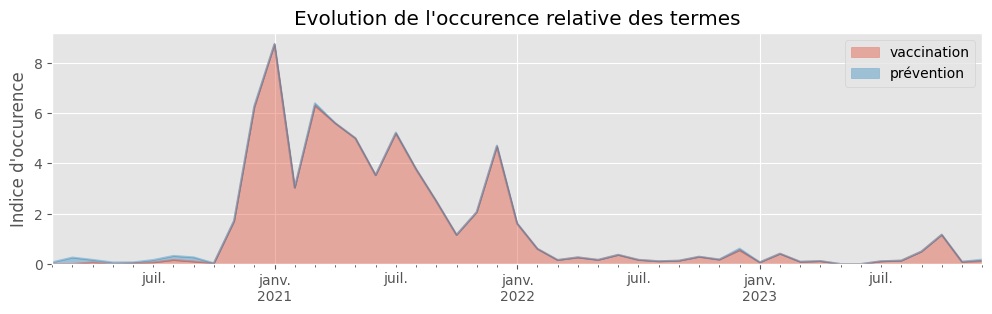

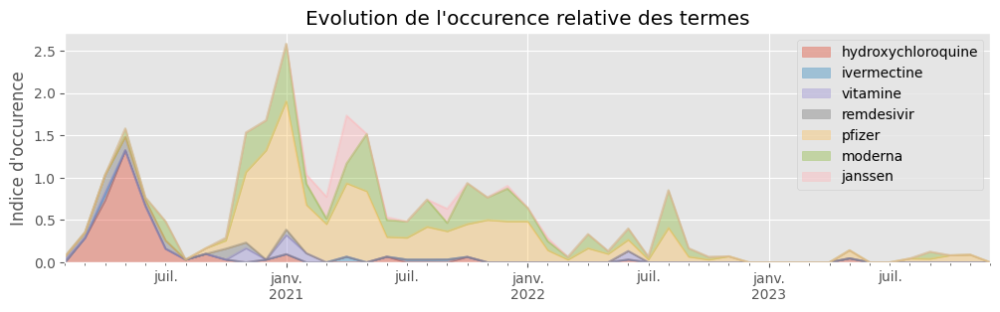

...

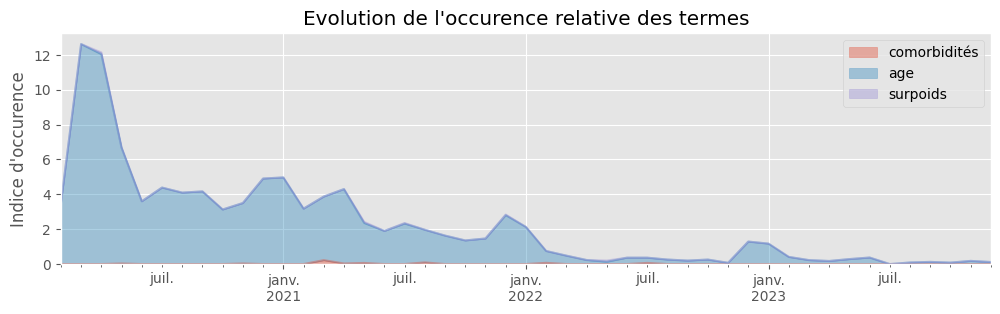

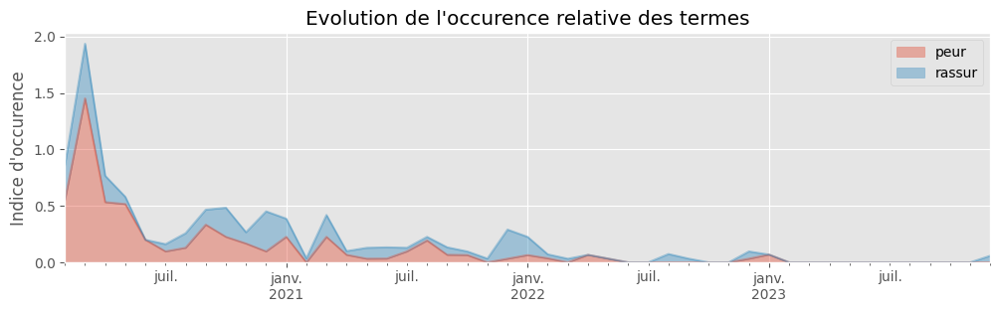

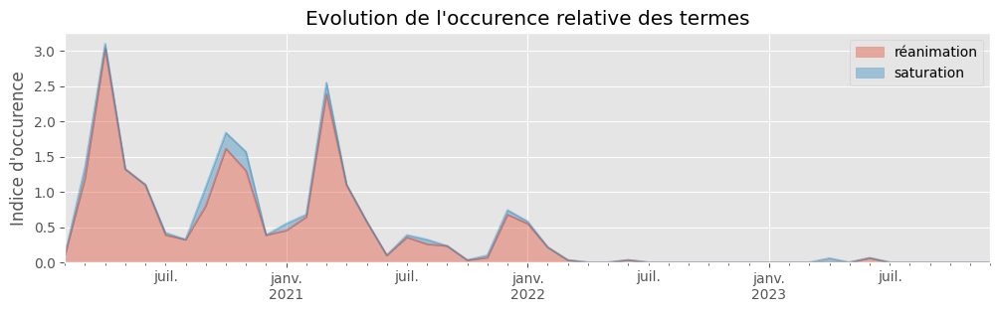

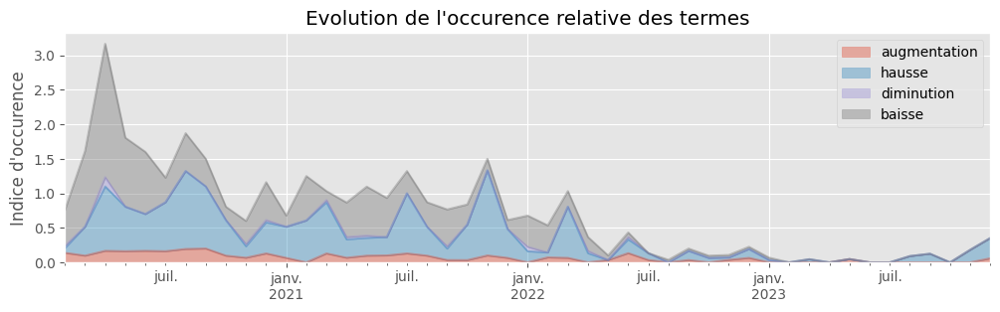

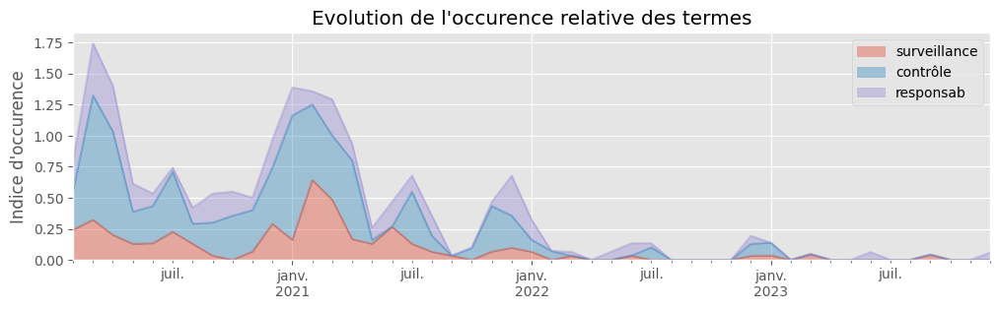

In [29]:
for keywords in list_keywords:
    print(keywords)
    analyse_trends(df=df_title.sum(axis=1), keywords=keywords, normalized=False)